In [1]:
import cv2
import sys
import warnings
import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
from sklearn.impute import SimpleImputer

warnings.filterwarnings('ignore')
np.set_printoptions(threshold=sys.maxsize)

In [2]:
class KDE:
    def __init__(self, bandwidth=1, kernel='gaussian'):
        self.kernel = kernel
        self.bandwidth = bandwidth
        self.data = None

    def set_bandwidth(self):
        log_likelihoods = []
        for bw in np.linspace(0.1, 1.0, 30):
            log_likelihoods.append(np.sum(np.log(self.kernel_density(self.data, bw) + 1e-10)))
        return np.linspace(0.1, 1.0, 30)[np.argmax(log_likelihoods)]

    def fit(self, data):
        self.data = np.asarray(data)
        if self.bandwidth is None:
            self.bandwidth = self.set_bandwidth()

    def kernel_density(self, x, bandwidth):
        if self.kernel == 'gaussian':
            if self.data.ndim == 1:
                return np.exp(-0.5 * ((x - self.data[:, np.newaxis]) / bandwidth) ** 2) / (np.sqrt(2 * np.pi) * bandwidth)
            else:
                x_diff = x - self.data[:, np.newaxis]
                return np.exp(-0.5 * (np.linalg.norm(x_diff, axis=-1) / bandwidth) ** 2) / ((2 * np.pi) ** (self.data.shape[1] / 2) * bandwidth ** self.data.shape[1])

        elif self.kernel == 'box':
            if self.data.ndim == 1:
                return (np.abs((x - self.data[:, np.newaxis]) / bandwidth) <= 0.5) / (bandwidth)
            else:
                x_diff = x - self.data[:, np.newaxis]
                return np.prod((np.abs(x_diff) / bandwidth) <= 0.5, axis=-1) / (bandwidth ** self.data.shape[1])

        elif self.kernel == 'triangular':
            if self.data.ndim == 1:
                return (1 - np.abs((x - self.data[:, np.newaxis]) / bandwidth)) / (bandwidth)
            else:
                x_diff = x - self.data[:, np.newaxis]
                return np.prod((1 - np.abs(x_diff) / bandwidth) * ((np.abs(x_diff) / bandwidth) <= 1), axis=-1) / (bandwidth ** self.data.shape[1])

    def evaluate(self, x):
        x = np.asarray(x)
        return np.mean(self.kernel_density(x, self.bandwidth), axis=0)

    def visualize(self, plot_range=None, num=100):
        if plot_range is None:
            plot_range = [np.min(self.data), np.max(self.data)]

        if self.data.ndim == 1:
            x_plot = np.linspace(plot_range[0], plot_range[1], num)
            y_plot = self.evaluate(x_plot)

            plt.hist(self.data, bins='auto', density=True, alpha=0.5, color='blue', label='Data histogram')
            plt.plot(x_plot, y_plot, '-k', label='Estimated PDF (KDE)')

        elif self.data.ndim == 2:
            meshgrid = np.meshgrid(*[np.linspace(plot_range[0], plot_range[1], num) for _ in range(self.data.shape[1])])
            meshgrid_flat = np.column_stack([m.flatten() for m in meshgrid])
            y_plot = self.evaluate(meshgrid_flat)

            plt.hist2d(self.data[:, 0], self.data[:, 1], bins=(50, 50), density=True, cmap=plt.cm.Blues, alpha=0.5, label='Data histogram')
            plt.contourf(meshgrid[0], meshgrid[1], y_plot.reshape((num, num)).T, cmap=plt.cm.Blues, levels=10, alpha=0.7)

        plt.title('Kernel Density Estimation (KDE)')
        plt.xlabel('Data values')
        plt.ylabel('Density')
        plt.show()

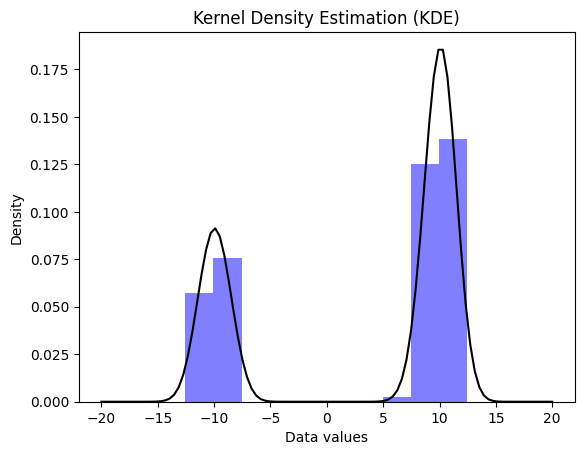

In [3]:
data = np.concatenate([np.random.normal(-10, 1, 100), np.random.normal(10, 1, 200)])

kde = KDE(kernel='gaussian')
kde.fit(data)
kde.visualize(plot_range=[-20, 20], num=100)

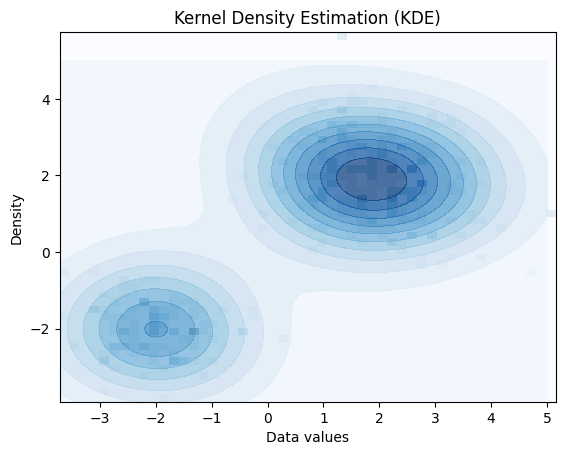

In [4]:
dist1 = np.random.multivariate_normal([-2, -2], [[0.5, 0], [0, 0.5]], 100)
dist2 = np.random.multivariate_normal([2, 2], [[1, 0], [0, 1]], 200)
data = np.concatenate([dist1, dist2])

kde = KDE(kernel='gaussian')
kde.fit(data)
kde.visualize(plot_range=[-5, 5], num=100)

In [5]:
def make_connections(image, df):

  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  image_with_boxes = image_rgb.copy()

  for index, row in df.iterrows():
      left = int(row['Left'][0])
      right = int(row['Right'][0])
      top = int(row['Top'][1])
      bottom = int(row['Bottom'][1])
      box_id = int(row['Id'])

      width = right - left
      height = bottom - top

      top_left = (left, top)
      bottom_right = (right, bottom)

      cv2.rectangle(image_with_boxes, top_left, bottom_right, (255, 0, 0), 2)

      label_position = (left, top - 10)
      cv2.putText(image_with_boxes, str(box_id), label_position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

      top_adjacent_id = int(row['Top Box'][1])
      bottom_adjacent_id = int(row['Bottom Box'][1])
      left_adjacent_id = int(row['Left Box'][1])
      right_adjacent_id = int(row['Right Box'][1])

      if top_adjacent_id != 0:
          top_adjacent_row = df[df['Id'] == top_adjacent_id].iloc[0]
          top_adjacent_center = int(top_adjacent_row['Bottom'][0]) , int(top_adjacent_row['Bottom'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(top)), top_adjacent_center, (0, 255, 0), 2)

      if bottom_adjacent_id != 0:
          bottom_adjacent_row = df[df['Id'] == bottom_adjacent_id].iloc[0]
          bottom_adjacent_center = int(bottom_adjacent_row['Top'][0]) , int(bottom_adjacent_row['Top'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(bottom)), (int(bottom_adjacent_center[0]), int(bottom_adjacent_center[1])), (0, 255, 0), 2)

      if left_adjacent_id != 0:
          left_adjacent_row = df[df['Id'] == left_adjacent_id].iloc[0]
          left_adjacent_center = int(left_adjacent_row['Right'][0]) , int(left_adjacent_row['Right'][1])
          cv2.line(image_with_boxes, (int(left), int(top) + height // 2), (int(left_adjacent_center[0]), int(left_adjacent_center[1])), (0, 255, 0), 2)

      if right_adjacent_id != 0:
          right_adjacent_row = df[df['Id'] == right_adjacent_id].iloc[0]
          right_adjacent_center = int(right_adjacent_row['Left'][0]) , int(right_adjacent_row['Left'][1])
          cv2.line(image_with_boxes, (int(right), int(top) + height // 2), (int(right_adjacent_center[0]), int(right_adjacent_center[1])), (0, 255, 0), 2)

  return image_with_boxes

def visualize_bboxes(img, df):
  img_2 = img.copy()
  for index, rows in df.iterrows():
    top_left = (int(rows['Top-Left'].split(',')[0][1:]),int(rows['Top-Left'].split(',')[1][:-1]))
    bottom_right = (int(rows['Bottom-Right'].split(',')[0][1:]),int(rows['Bottom-Right'].split(',')[1][:-1]))
    cv2.rectangle(img_2, top_left, bottom_right, (255, 0, 0), 2)

    plt.imshow(img_2)

In [6]:
def get_distance(a, b):
    return np.sqrt(np.sum((np.array(a)-np.array(b))**2))

def fill_distance(data, attr, altr, metric, threshold, box):
    for i, row in data.iterrows():
        nearest = None
        center = eval(row[attr])
        min_distance = 2000

        for j, other_row in data.iterrows():
            if i == j: continue  
            other_center = eval(other_row[altr])
            distance = get_distance(center, other_center)

            if distance < min_distance:
                min_distance = distance
                nearest = other_row['Id']
                
        data.at[i, metric] = min_distance
        if threshold != -1:
            if min_distance < threshold:
                data.at[i, box] = [min_distance, nearest]
            else:
                data.at[i, box] = [-1, 0]

def get_threshold(values, bw=1):
    imputer = SimpleImputer(strategy='mean')
    values = imputer.fit_transform(values.reshape(-1, 1))

    kde = KDE(bandwidth=bw, kernel='gaussian')
    kde.fit(values)
    kde_values = kde.evaluate(values)

    probability_threshold = np.percentile(kde_values, 60)
    distances = values[np.where(kde_values >= probability_threshold)[0]]
    threshold_distance = np.mean(distances)
    return threshold_distance

In [7]:
def preprocess1(data):
    for i in range(len(data)):
        top_left = (int(data['Top-Left'][i].split(',')[0][1:]),int(data['Top-Left'][i].split(',')[1][:-1]))
        bottom_right = (int(data['Bottom-Right'][i].split(',')[0][1:]),int(data['Bottom-Right'][i].split(',')[1][:-1]))
        data.at[i, 'Top'] = '['+str((top_left[0]+(bottom_right[0]-top_left[0])/2))+', '+str((top_left[1]))+']'
        data.at[i, 'Bottom'] = '['+str((top_left[0]+(bottom_right[0]-top_left[0])/2))+', '+str(((bottom_right[1])))+']'
        data.at[i, 'Left'] = '['+str((top_left[0]))+', '+str((top_left[1]+(bottom_right[1]-top_left[1])/2))+']'
        data.at[i, 'Right'] = '['+str((bottom_right[0]))+', '+str((top_left[1]+(bottom_right[1]-top_left[1])/2))+']'
        data.at[i, 'Top Box'] = 'nan'
        data.at[i, 'Bottom Box'] = 'nan'
        data.at[i, 'Right Box'] = 'nan'
        data.at[i, 'Left Box'] = 'nan'
        data.at[i, 'min_top_distance'] = 0  
        data.at[i, 'min_bottom_distance'] = 0
        data.at[i, 'min_left_distance'] = 0
        data.at[i, 'min_right_distance'] = 0

def preprocess2(data):
    for i in range(len(data)):
        top_left = (int(data['Top-Left'][i].split(',')[0][1:]), int(data['Top-Left'][i].split(',')[1][:-1]))
        bottom_right = (int(data['Bottom-Right'][i].split(',')[0][1:]), int(data['Bottom-Right'][i].split(',')[1][:-1]))

        data.at[i, "Top"] = [(top_left[0] + (bottom_right[0] - top_left[0]) / 2), int(top_left[1])]
        data.at[i, "Bottom"] = [(top_left[0] + (bottom_right[0] - top_left[0]) / 2), (((bottom_right[1])))]
        data.at[i, "Left"] = [((top_left[0])), ((top_left[1] + (bottom_right[1] - top_left[1]) / 2))]
        data.at[i, "Right"] = [((bottom_right[0])), ((top_left[1] + (bottom_right[1] - top_left[1]) / 2))]
        data.at[i, 'Top-Left'] = [int(data['Top-Left'][i].split(',')[0][1:]), int(data['Top-Left'][i].split(',')[1][:-1])]
        data.at[i, 'Bottom-Right'] = [int(data['Bottom-Right'][i].split(',')[0][1:]), int(data['Bottom-Right'][i].split(',')[1][:-1])]

def plot_figures(img, image_id, data, plot):
    plt.figure(figsize=(15, 10))
    if plot == 0:
        plt.imshow(img)
        plt.title(f'Image with Bounding Boxes {image_id}')
        plt.show()

    if plot == 1:
        plt.subplot(1, 3, 1)
        plt.hist(data['min_top_distance'], bins='auto', density=True, alpha=0.5, color='blue')
        plt.title('min_top_distance Density')
        plt.xlabel('Distance')
        plt.ylabel('Density')

        plt.subplot(1, 3, 2)
        plt.hist(data['min_left_distance'], bins='auto', density=True, alpha=0.5, color='orange')
        plt.title('min_bottom_distance Density')
        plt.xlabel('Distance')
        plt.ylabel('Density')

        plt.subplot(1, 3, 3)
        plt.imshow(img)
        plt.title(f'Image with Bounding Boxes {image_id}')
        plt.show()
        
    if plot == 2:
        plt.title(f"Image using assign-2 algorithm {image_id}")
        plt.imshow(img)
        plt.show()

In [8]:
def visualize_image(image_id, bw, plot):
    """
    function to visualize each image by using image id

    :param p1: image id of the image
    :param p2: bandwidth to be used in kde
    :param p3: plot 0: find threshold using kde and plot final output image
               plot 1: find threshold using kde and plot 2 density estimation curves along with final output image
               plot 2: use threshold=100 and plot the final output image
    :return: no return value
    """
    data = pd.read_csv('SMAI-AQ2/CSV/TLBR_{}.csv'.format(image_id))
    preprocess1(data)

    if plot == 0 or plot == 1:
        fill_distance(data, 'Top', 'Bottom', 'min_top_distance', -1, '')
        fill_distance(data, 'Bottom', 'Top', 'min_bottom_distance', -1, '')
        fill_distance(data, 'Left', 'Right', 'min_right_distance', -1, '')
        fill_distance(data, 'Right', 'Left', 'min_left_distance', -1, '')

        threshold_top = get_threshold(data['min_top_distance'].values, bw)
        threshold_bottom = get_threshold(data['min_bottom_distance'].values, bw)
        threshold_left = get_threshold(data['min_left_distance'].values, bw)
        threshold_right = get_threshold(data['min_right_distance'].values, bw)
        print('Threshold Values: Top: {:.4f} Bottom: {:.4f} Left: {:.4f} Right: {:.4f}'.format(threshold_top, threshold_bottom, threshold_left, threshold_right))

        fill_distance(data, 'Top', 'Bottom', 'min_top_distance', threshold_top, 'Top Box')
        fill_distance(data, 'Bottom', 'Top', 'min_bottom_distance', threshold_bottom, 'Bottom Box')
        fill_distance(data, 'Left', 'Right', 'min_right_distance', threshold_right, 'Left Box')
        fill_distance(data, 'Right', 'Left', 'min_left_distance', threshold_left, 'Right Box')

    if plot == 2:
        threshold = 100
        fill_distance(data, 'Top', 'Bottom', 'min_top_distance', threshold, 'Top Box')
        fill_distance(data, 'Bottom', 'Top', 'min_bottom_distance', threshold, 'Bottom Box')
        fill_distance(data, 'Left', 'Right', 'min_right_distance', threshold, 'Left Box')
        fill_distance(data, 'Right', 'Left', 'min_left_distance', threshold, 'Right Box')

    preprocess2(data)
    img = cv2.imread('SMAI-AQ2/images/{}.jpg'.format(image_id))
    img = make_connections(img, data)
    plot_figures(img, image_id, data, plot)

Threshold Values: Top: 90.9683 Bottom: 92.6278 Left: 21.2871 Right: 21.2871


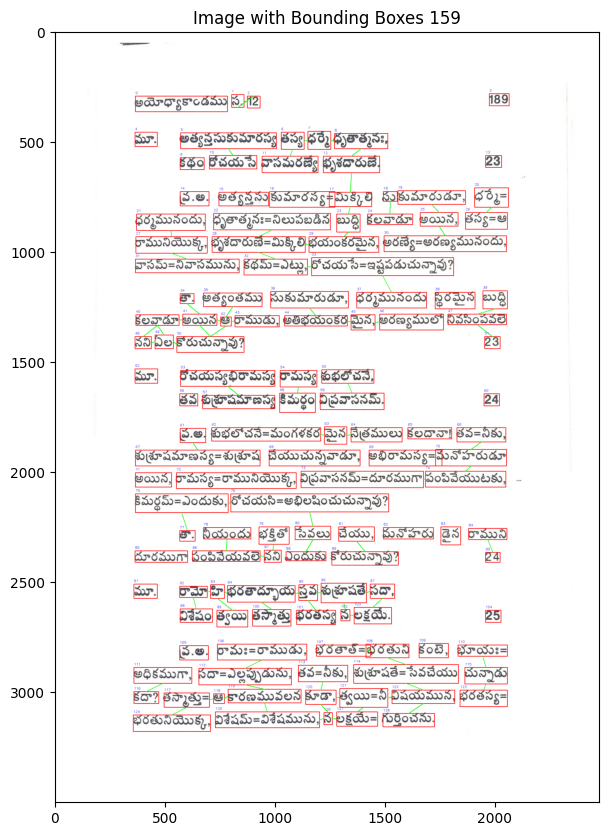

In [9]:
visualize_image('159', 1, 0)

Threshold Values: Top: 51.8274 Bottom: 49.1736 Left: 26.2534 Right: 26.2534


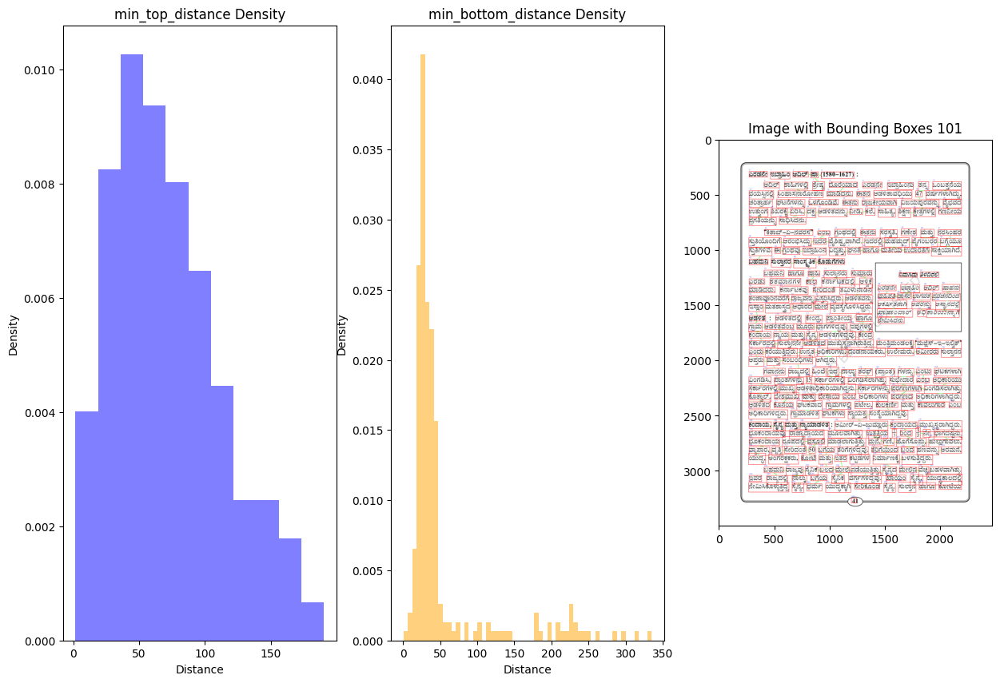

Threshold Values: Top: 51.1813 Bottom: 50.3003 Left: 26.0677 Right: 26.0677


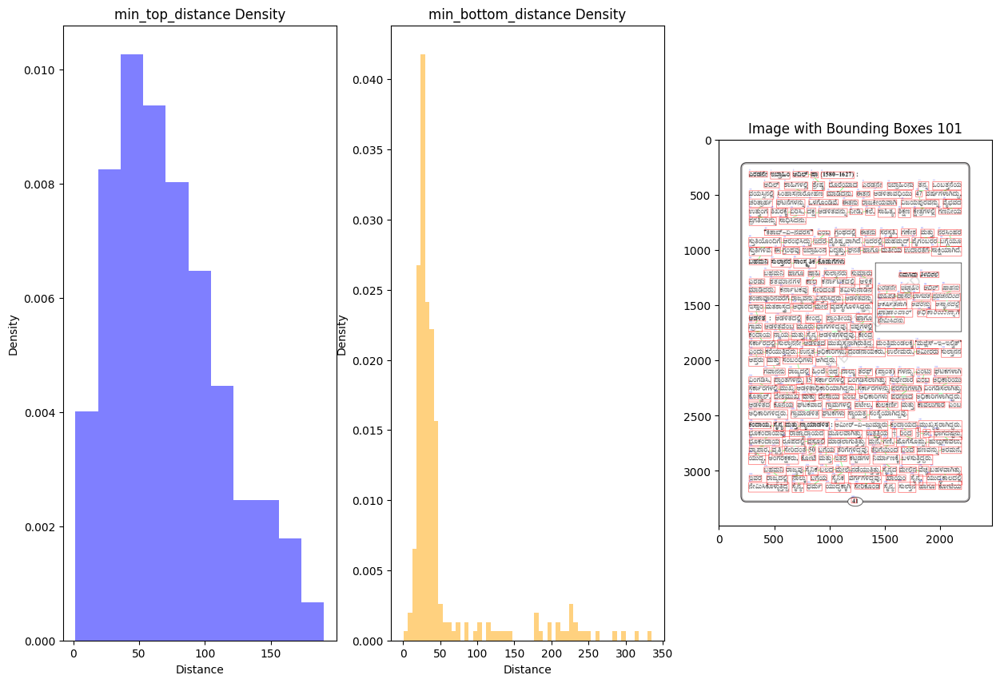

Threshold Values: Top: 45.6645 Bottom: 45.2158 Left: 26.3731 Right: 26.3731


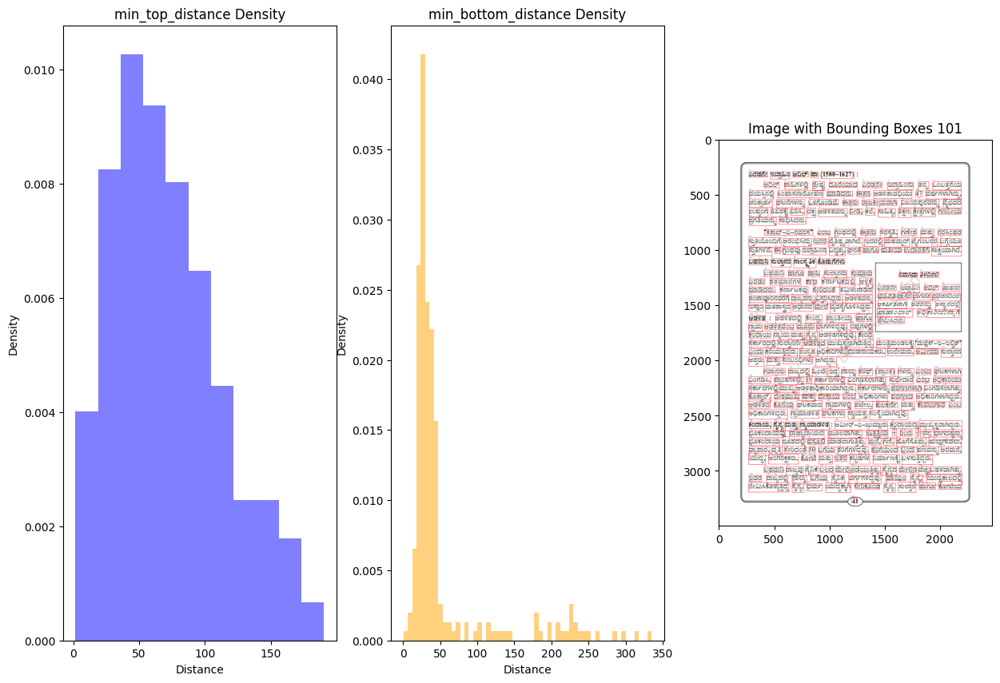

Threshold Values: Top: 46.0076 Bottom: 45.7762 Left: 26.6923 Right: 26.6923


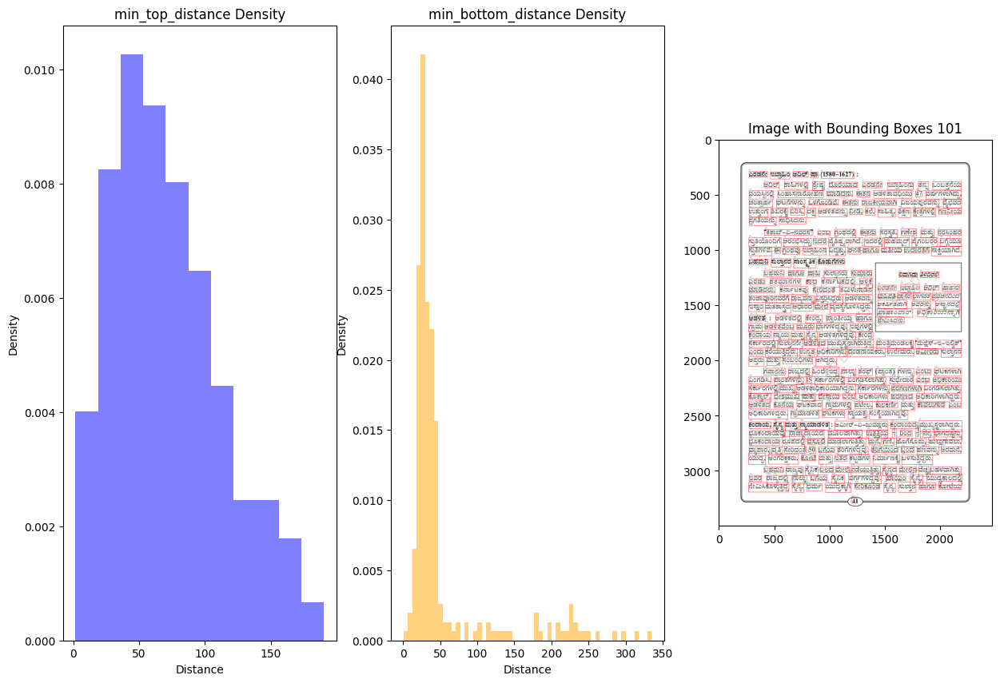

Threshold Values: Top: 52.9238 Bottom: 54.4522 Left: 30.0790 Right: 30.0790


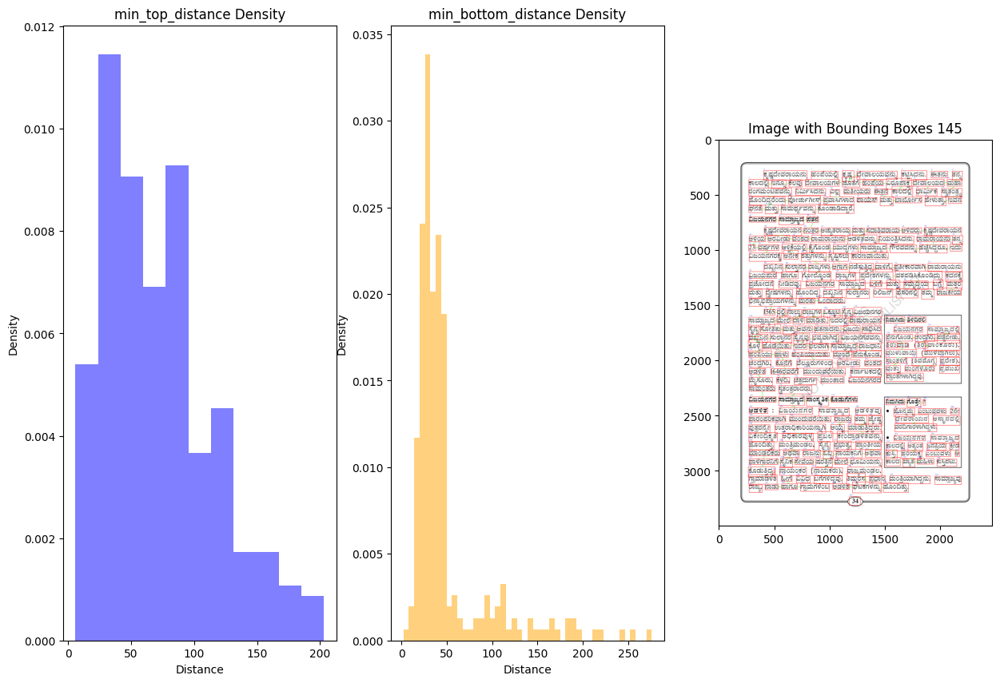

Threshold Values: Top: 50.8142 Bottom: 49.8901 Left: 28.9068 Right: 28.9068


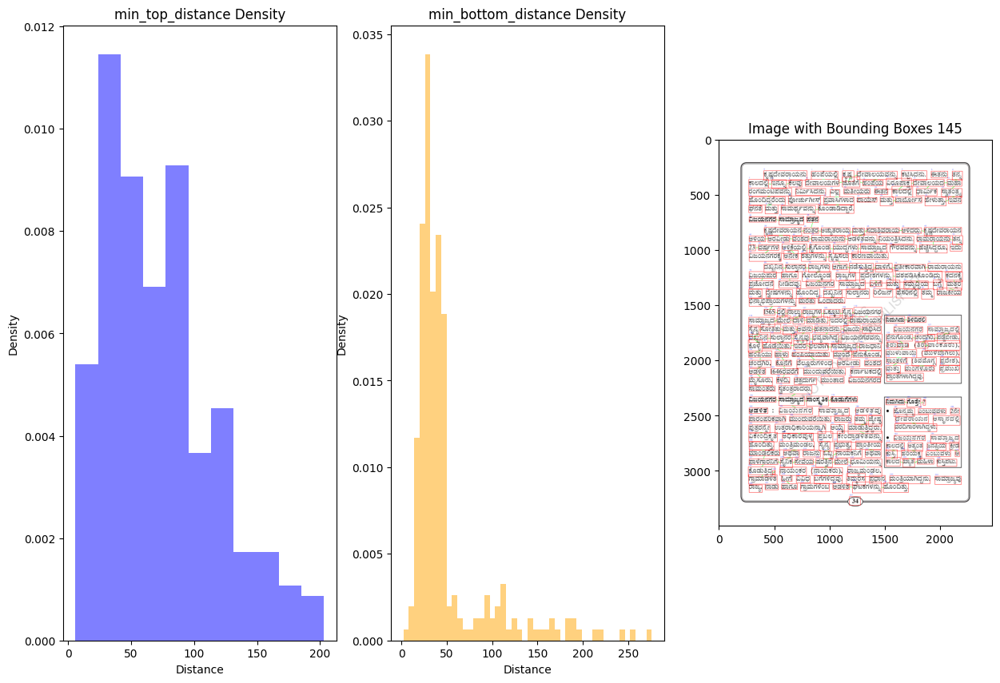

Threshold Values: Top: 50.8009 Bottom: 48.1912 Left: 28.3376 Right: 28.3376


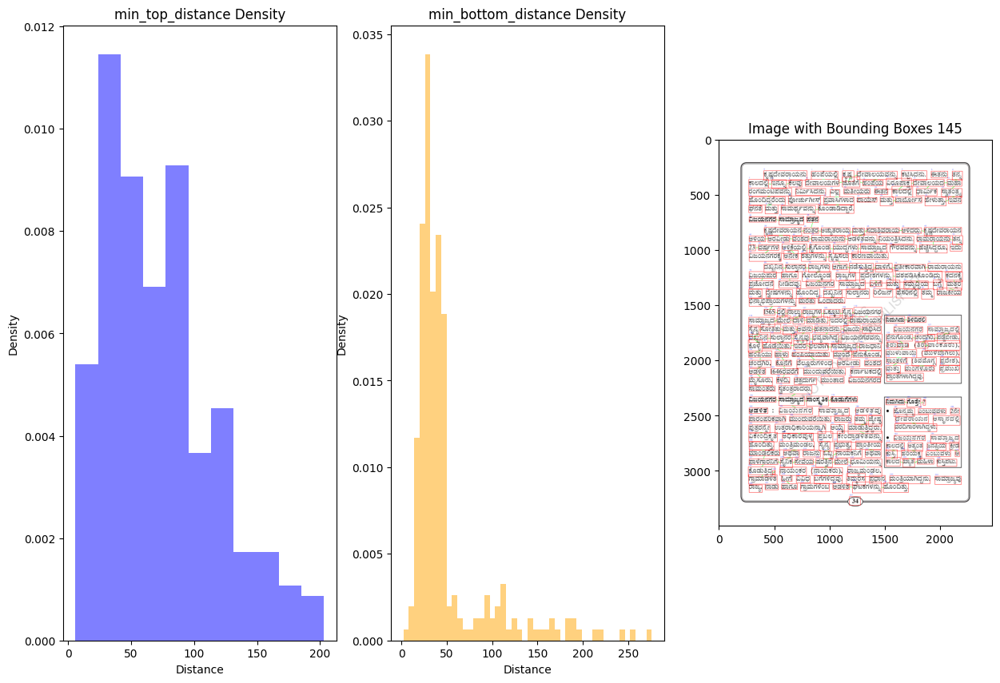

Threshold Values: Top: 51.7093 Bottom: 48.7651 Left: 28.1049 Right: 28.1049


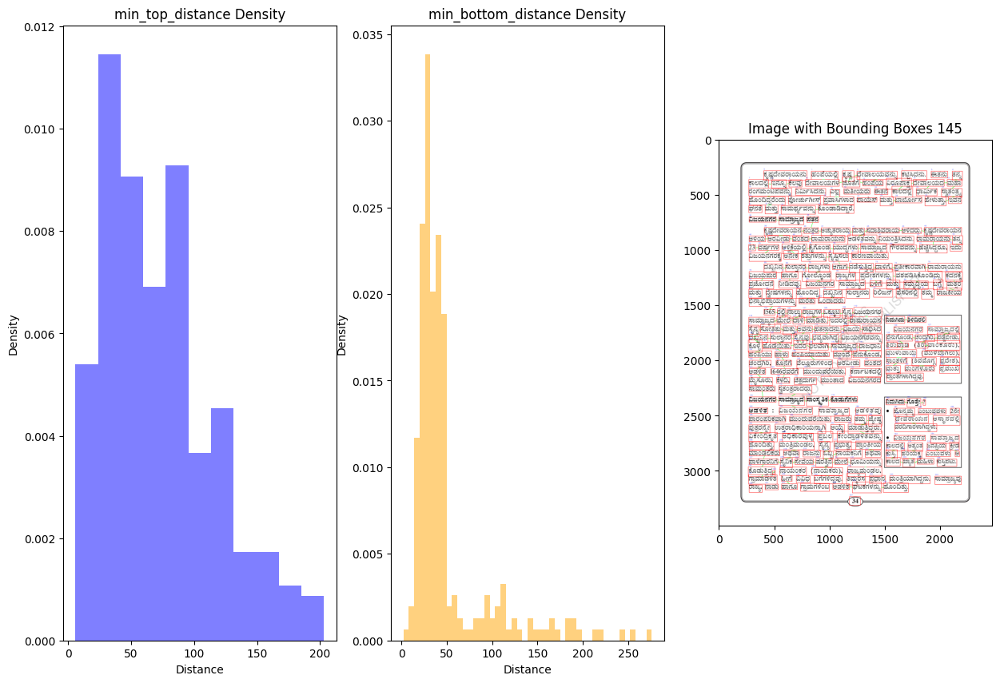

Threshold Values: Top: 83.1351 Bottom: 73.5484 Left: 27.4762 Right: 27.4762


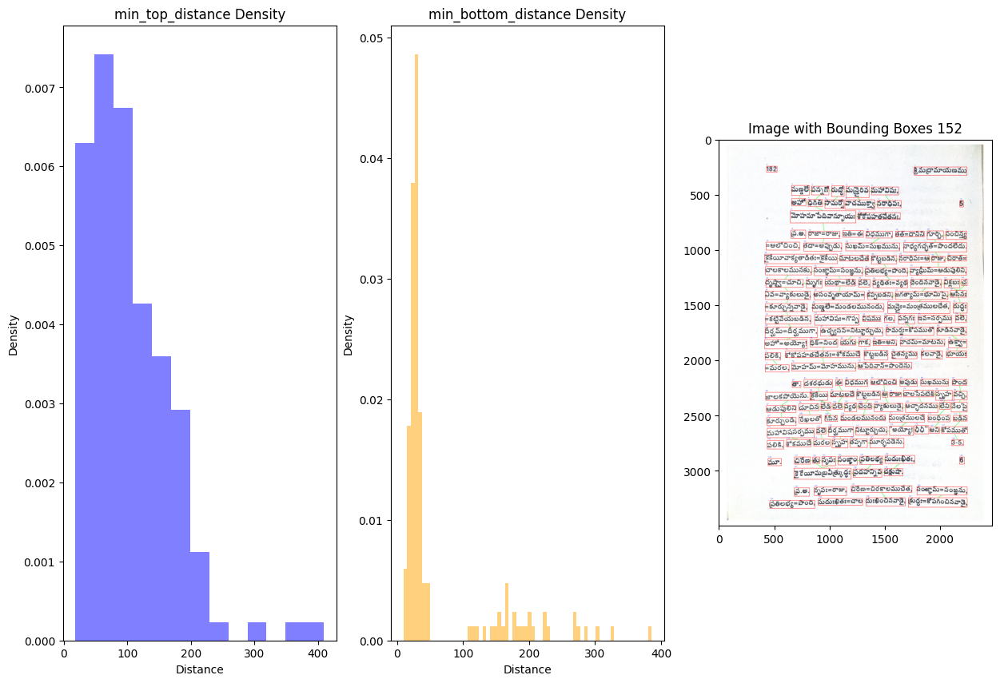

Threshold Values: Top: 78.7776 Bottom: 67.4582 Left: 27.8706 Right: 27.8706


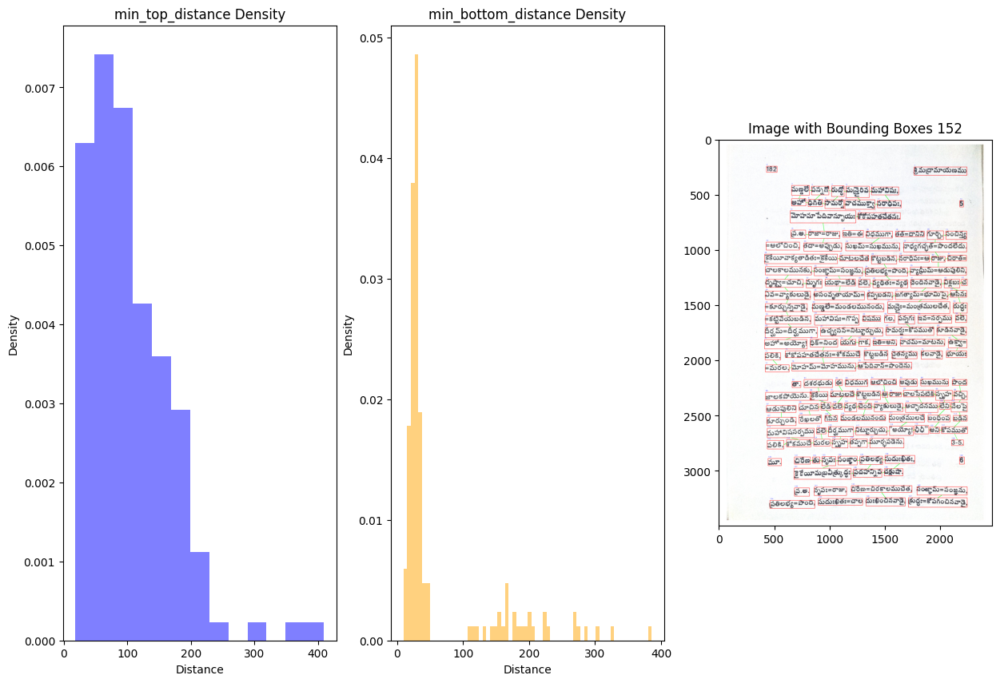

Threshold Values: Top: 66.2462 Bottom: 62.8420 Left: 27.8706 Right: 27.8706


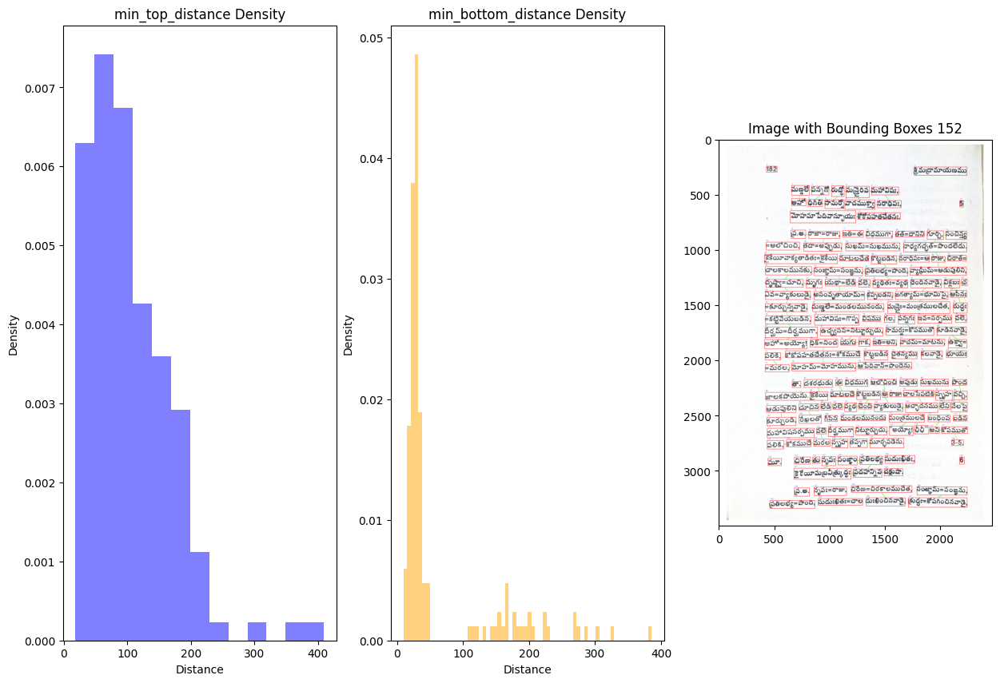

Threshold Values: Top: 64.5281 Bottom: 63.7144 Left: 27.7096 Right: 27.7096


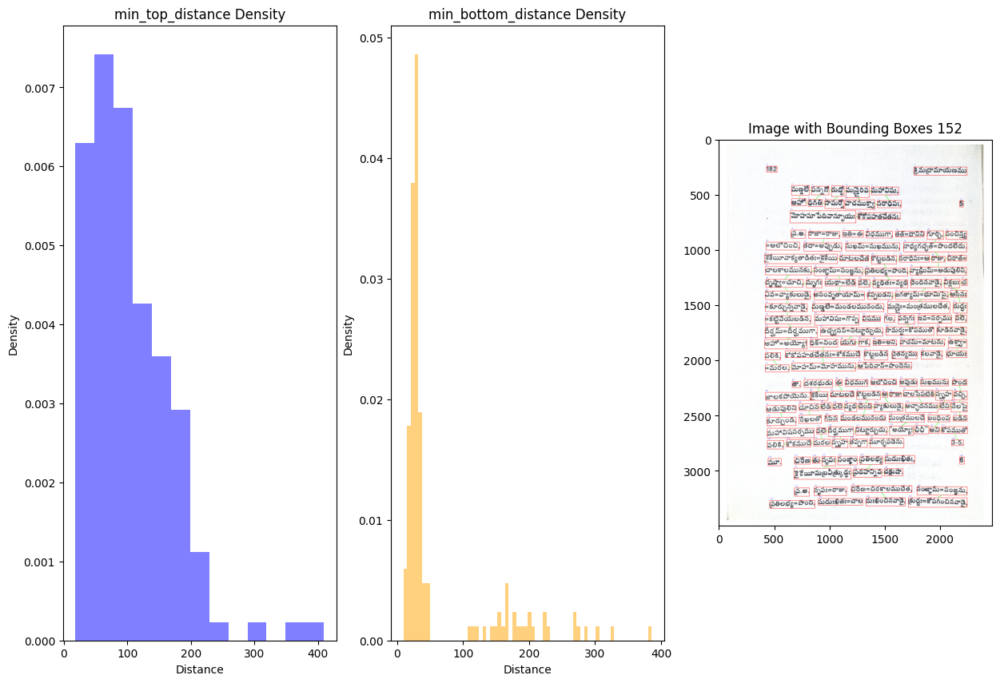

Threshold Values: Top: 90.9683 Bottom: 92.6278 Left: 21.2871 Right: 21.2871


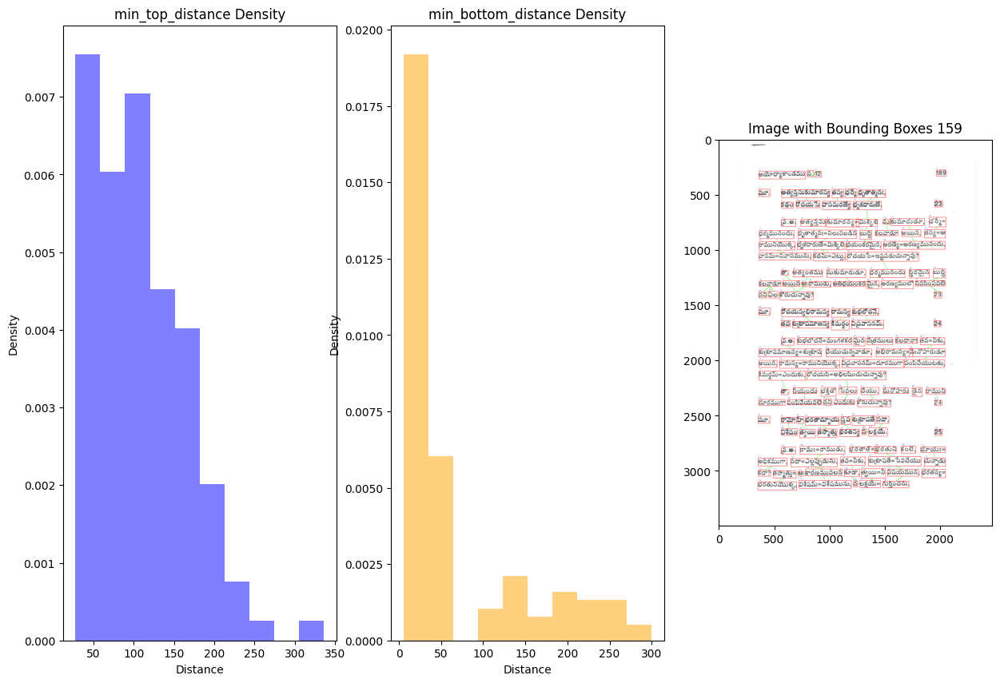

Threshold Values: Top: 82.5163 Bottom: 75.9164 Left: 21.4617 Right: 21.4617


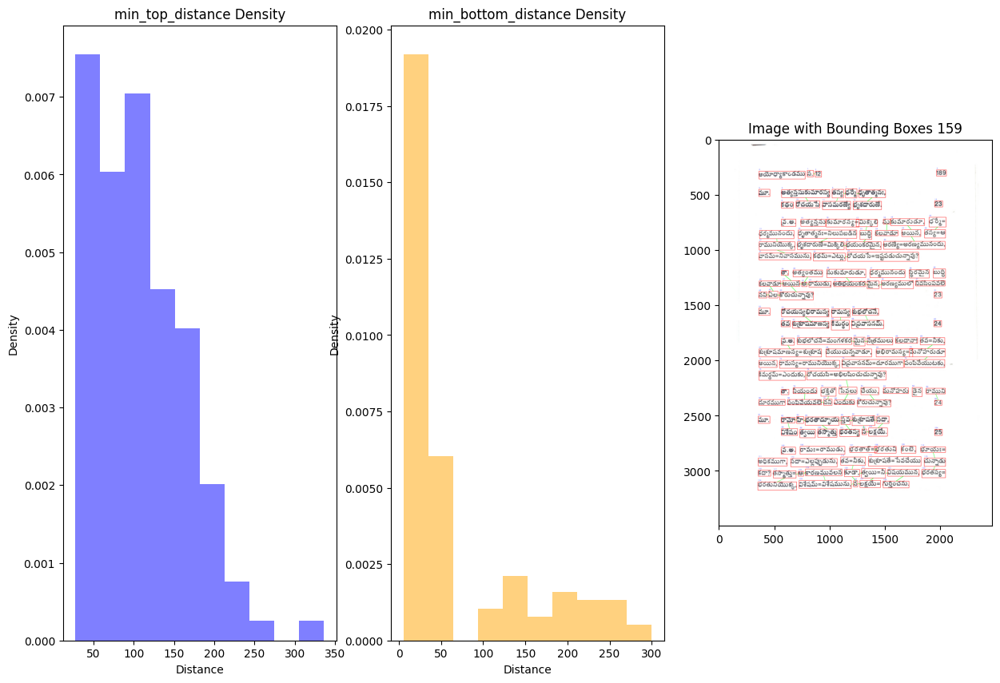

Threshold Values: Top: 80.5002 Bottom: 78.5275 Left: 21.6460 Right: 21.6460


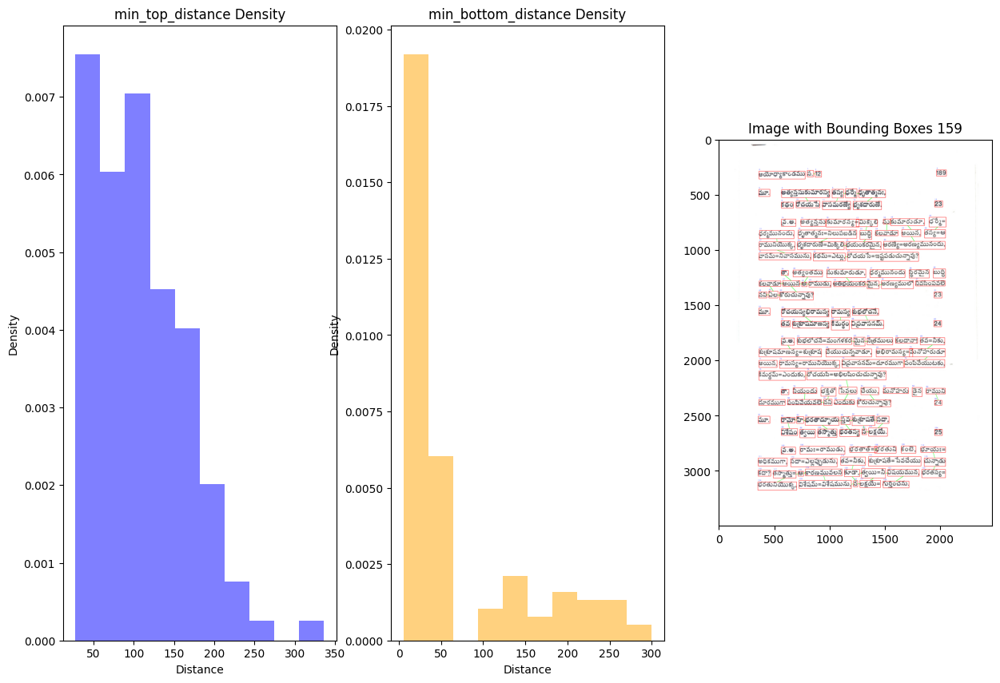

Threshold Values: Top: 83.9223 Bottom: 80.6329 Left: 22.0239 Right: 22.0239


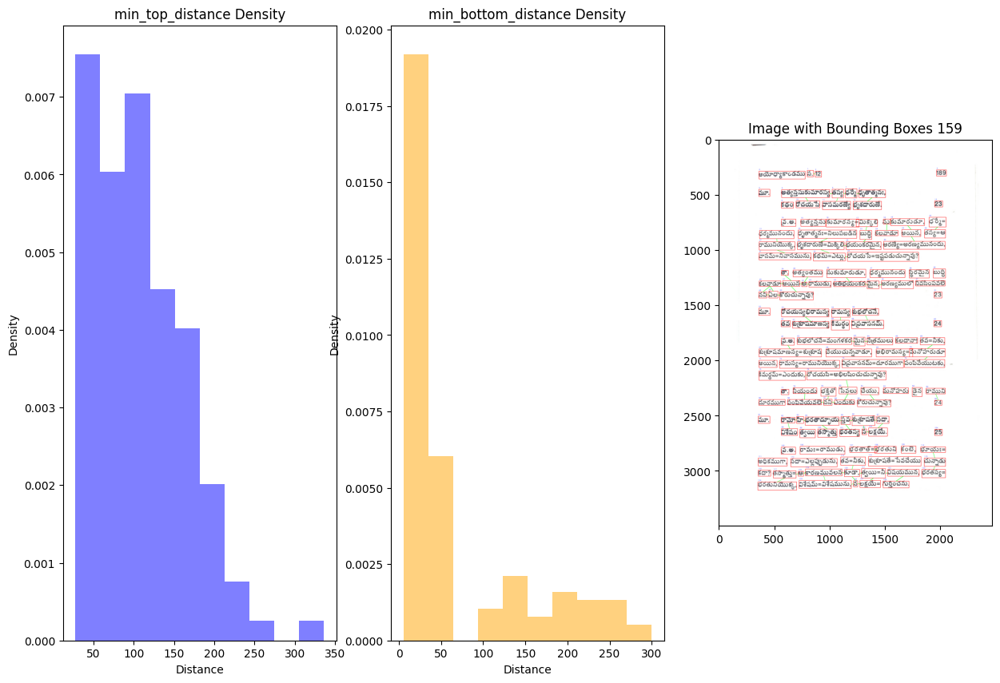

In [10]:
ids = ['101', '145', '152', '159']
bandwidth = [1, 2, 3, 4]

for image_id in ids:
    for bw in bandwidth:
        visualize_image(image_id, bw, 1)

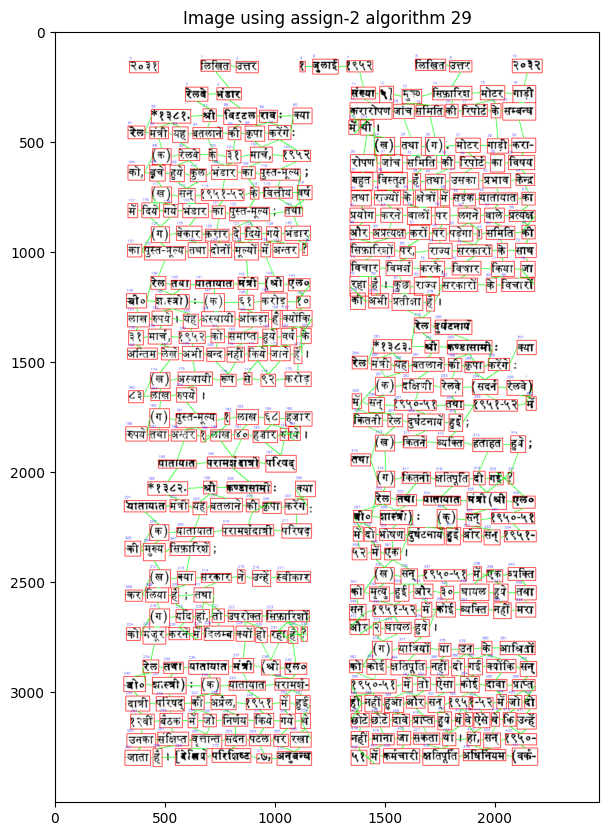

Threshold Values: Top: 31.4818 Bottom: 31.8422 Left: 19.9508 Right: 19.9508


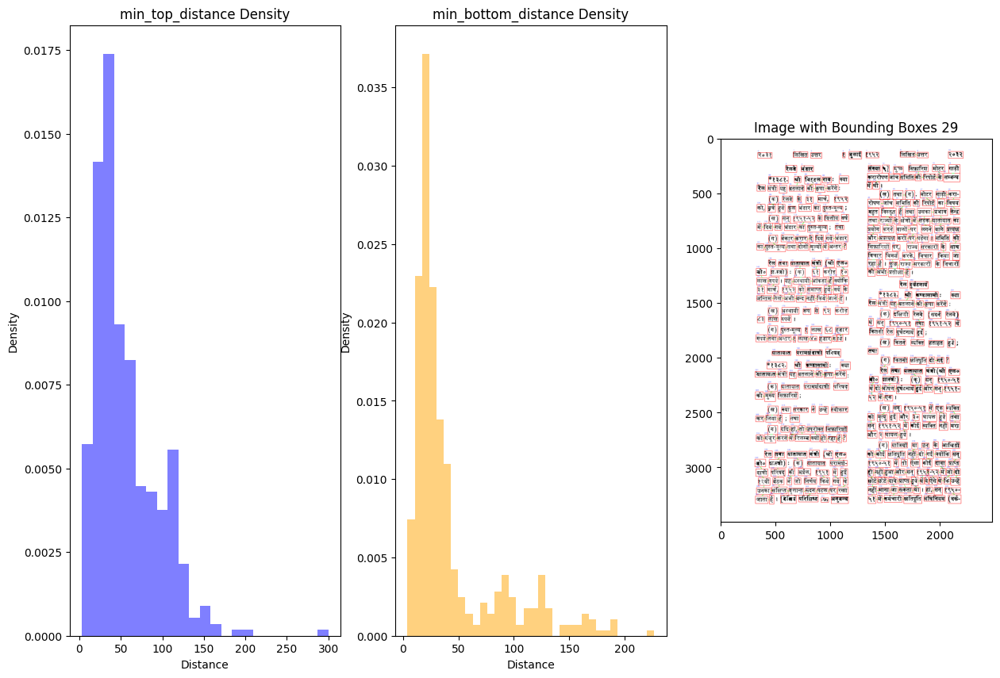

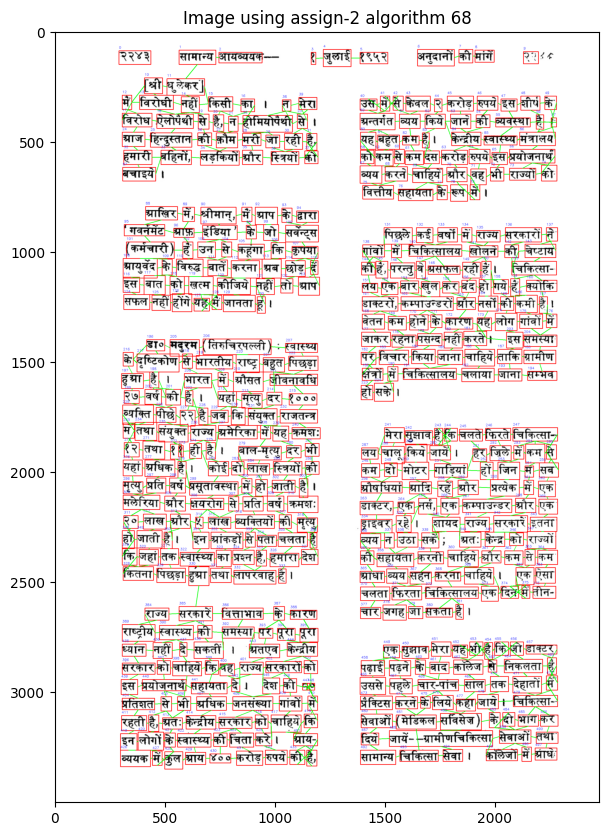

Threshold Values: Top: 29.4801 Bottom: 29.5259 Left: 16.9942 Right: 16.9942


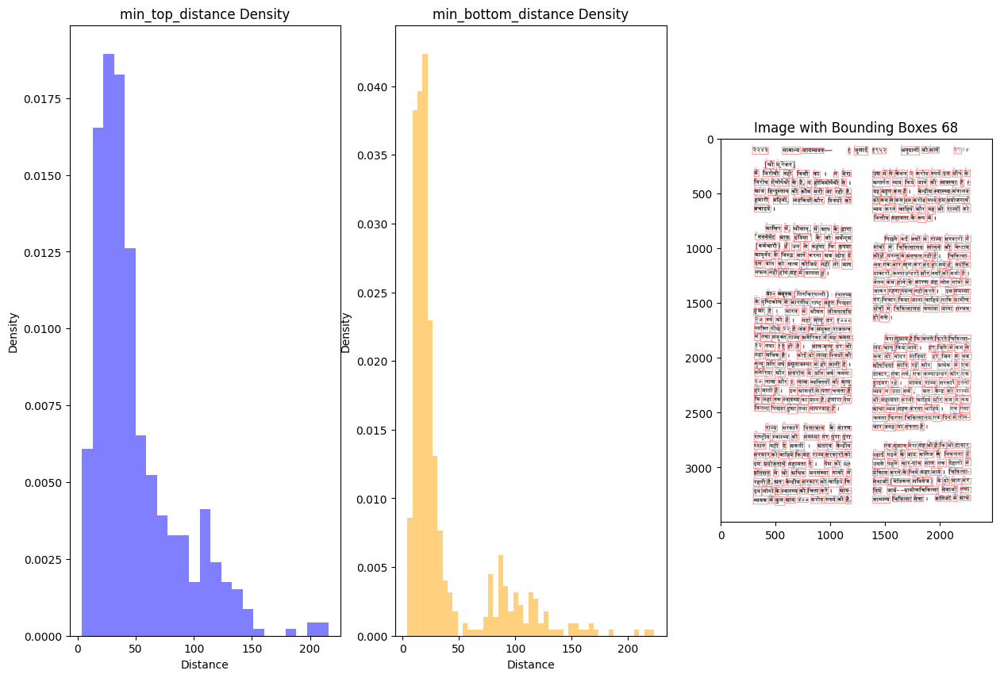

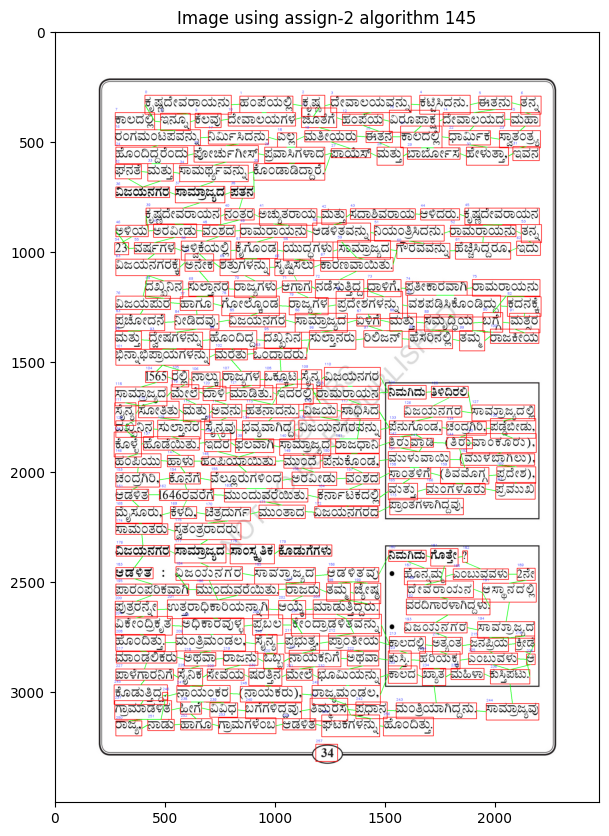

Threshold Values: Top: 52.9238 Bottom: 54.4522 Left: 30.0790 Right: 30.0790


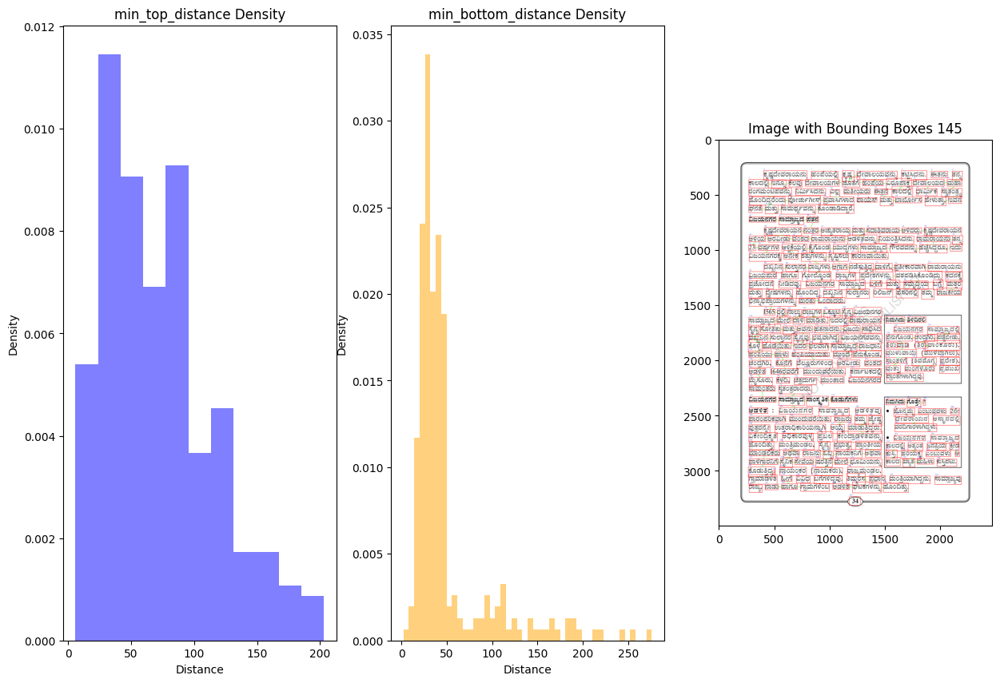

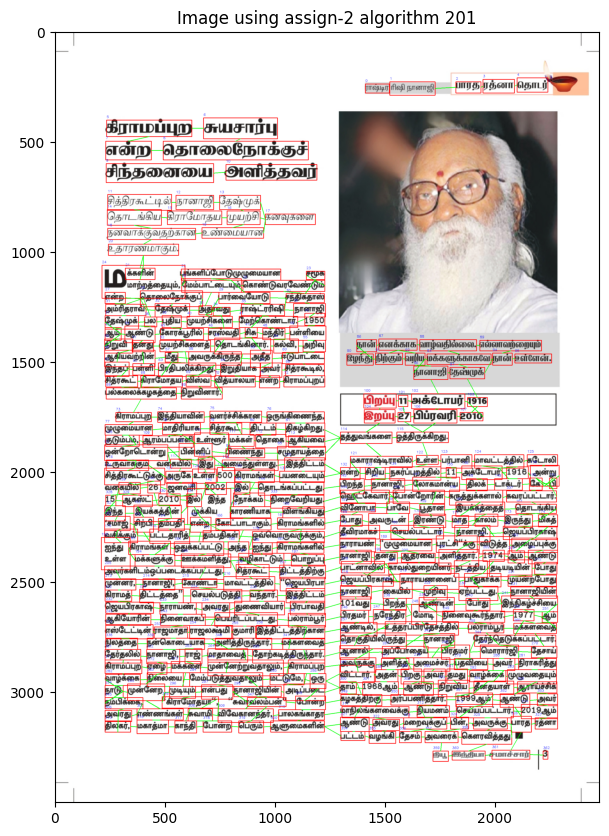

Threshold Values: Top: 37.1804 Bottom: 33.3172 Left: 23.6129 Right: 24.0544


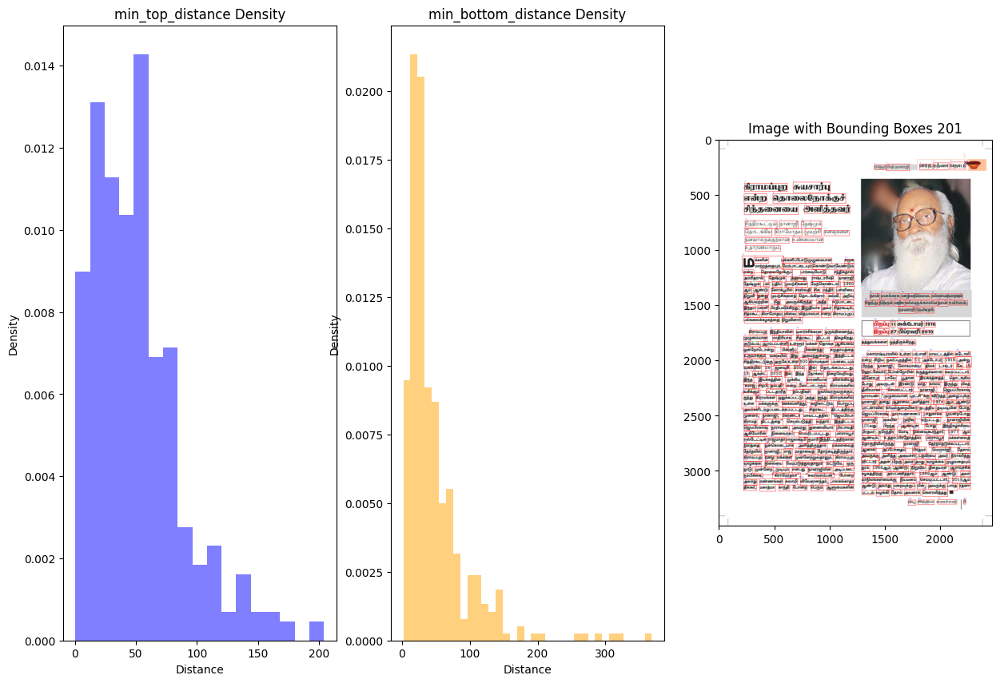

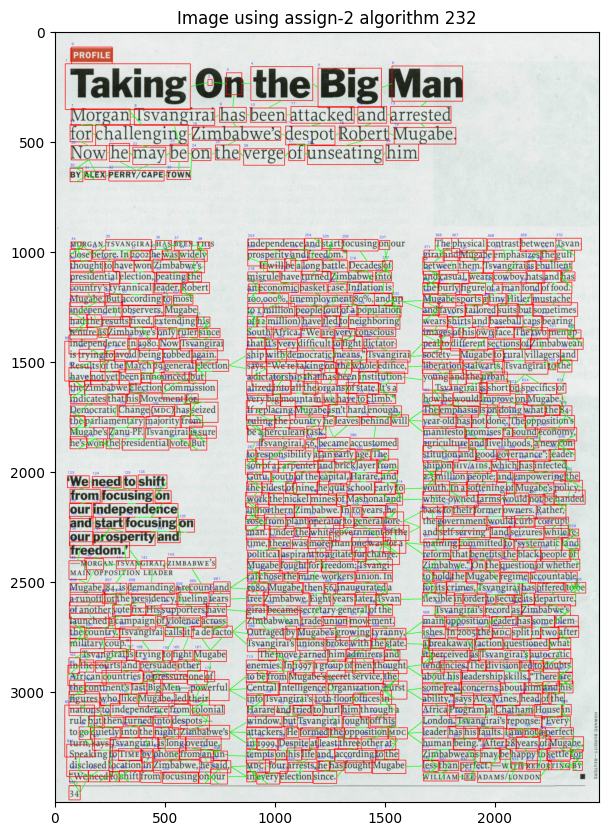

Threshold Values: Top: 24.1763 Bottom: 24.5978 Left: 5.4035 Right: 5.4035


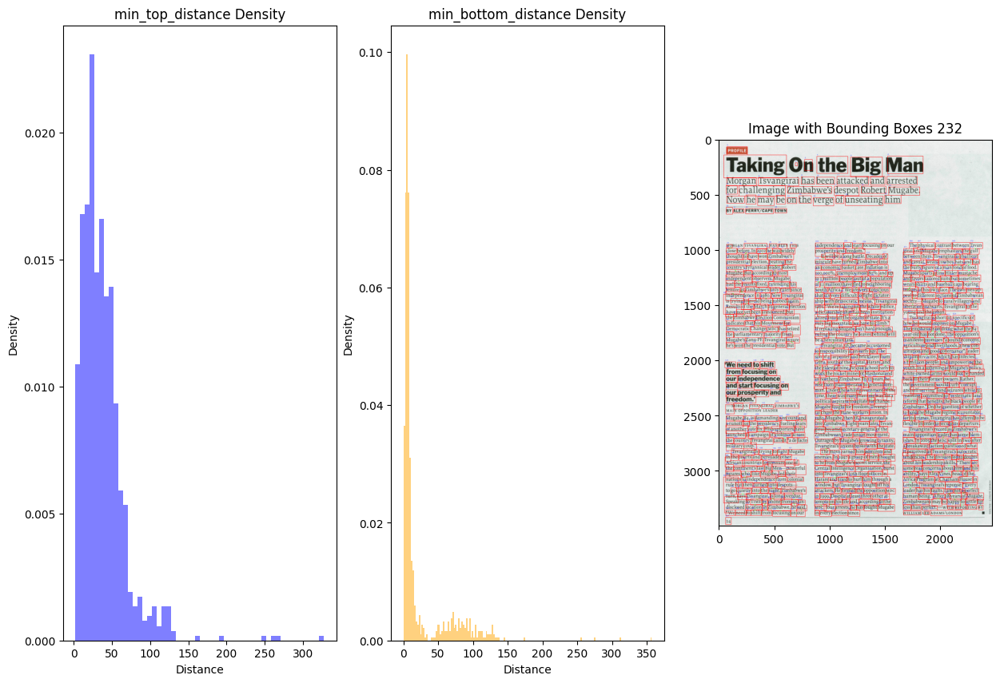

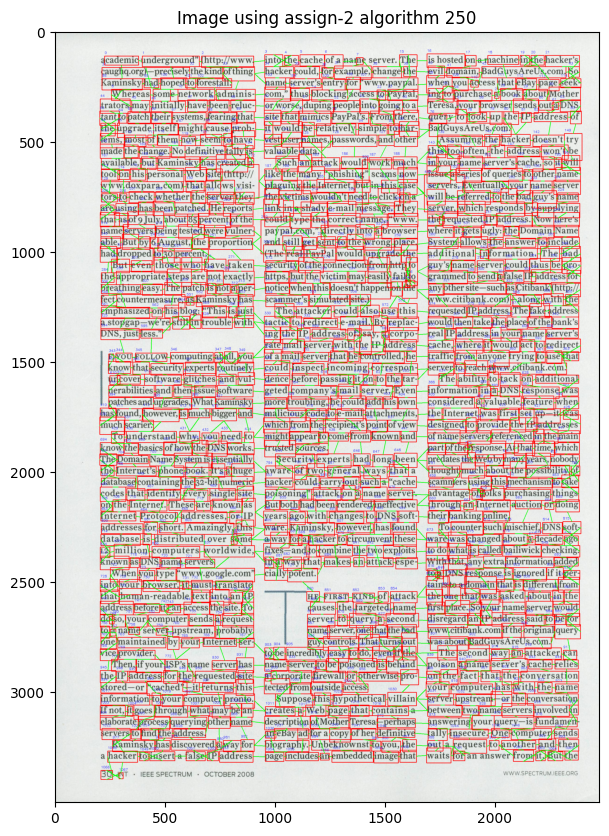

Threshold Values: Top: 21.1334 Bottom: 21.7918 Left: 5.9373 Right: 5.9414


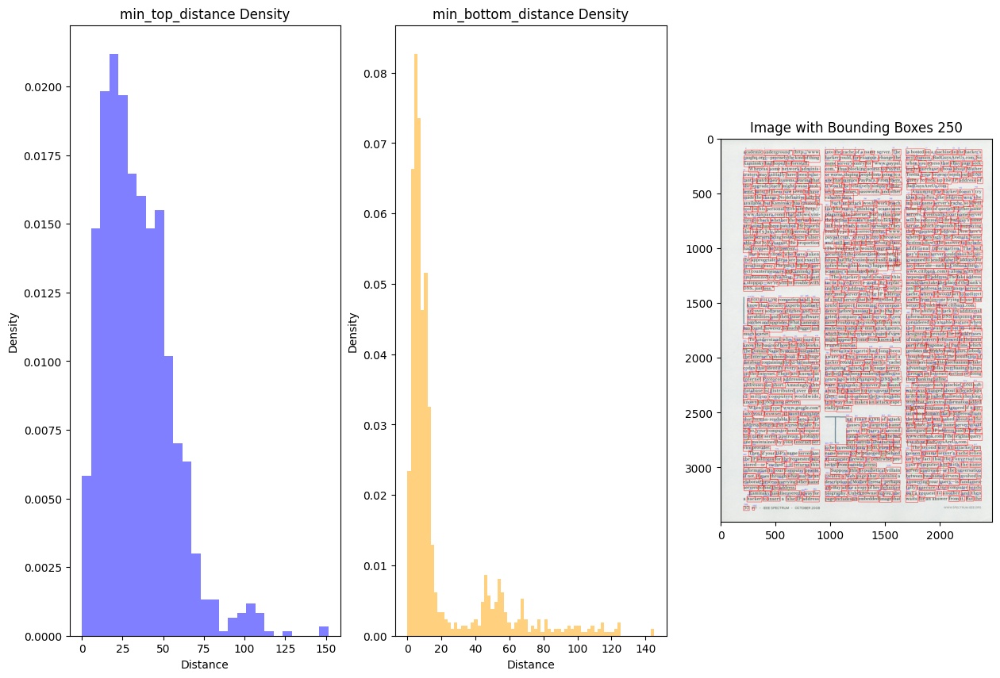

In [11]:
ids = ['29', '68', '145', '201', '232', '250']
for image_id in ids:
    visualize_image(image_id, 1, 2)
    visualize_image(image_id, 1, 1)